# HW2: Single-View Geometry

### Imports

In [1]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import numpy as np
import warnings; warnings.simplefilter('ignore')
import matplotlib.lines as mlines

from PIL import Image

# Part 1: Line-line intersection

In this section we will build up some tools we will use later. They are not part of any particular question, and the Problems 1-3 in the question paper can be found right after the next 2 chunks.

In [2]:
# Provided plotting functions

def draw_line(x,y,xlims=[0, 15],c='b--'):
    xrange = np.arange(xlims[0],xlims[1],0.1)
    A = np.vstack([x, np.ones(len(x))]).T
    k, b = np.linalg.lstsq(A, y)[0]
    plt.plot(xrange, k*xrange + b, c)
    
def newline(p1, p2, segment = True, linestyle = '-', color='r'):
    ax = plt.gca()
    xmin, xmax = ax.get_xbound()

    if (p2[0] == p1[0]):
        xmin = xmax = p1[0]
        ymin, ymax = ax.get_ybound()
    else:
        ymax = p1[1]+(p2[1]-p1[1])/(p2[0]-p1[0])*(xmax-p1[0])
        ymin = p1[1]+(p2[1]-p1[1])/(p2[0]-p1[0])*(xmin-p1[0])
    
    if segment:
        l = mlines.Line2D([p1[0], p2[0]], [p1[1], p2[1]], linestyle=linestyle, color=color)
    else:
        l = mlines.Line2D([xmin, xmax], [ymin, ymax], linestyle=linestyle, color=color)

    ax.add_line(l)
    return l

## Problem 1

Easy. To be written later.

## Problem 2

Easy. To be written later.

## Problem 3

Here we define the function `intersect_approx` that finds the best approximation for the intersection of a set of lines, defined in the least squares sense, as described in the problem.

In [3]:
def intersect_approx(a_vec, n_vec):
    n_matrix = n_vec[:, :, np.newaxis]@n_vec[:, np.newaxis, :]
    a_matrix = a_vec[:, :, np.newaxis]
    projs = np.eye(2) - n_matrix
    
    return np.linalg.lstsq(projs.sum(axis=0), (projs@a_matrix).sum(axis=0), rcond=None)[0]

We now test this function to find the best approximation of the intersection of 6 lines, defined by the given pair of $6\times 2$ matrices P0 and P1. We observe that the function works fine.

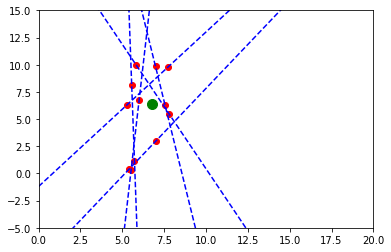

In [4]:
n = 6
P0 = np.stack((np.array([5, 5]) + 3*np.random.random(size=2) for i in range(n)))
a = np.linspace(0, 2*np.pi,n) + np.random.random(size=n)*np.pi/5.0
P1 = np.array([5 + 5*np.sin(a),5 + 5*np.cos(a)]).T

x = np.stack((P0[:,0], P0[:,1]))
y = np.stack((P1[:,0], P1[:,1]))

plt.xlim([0,20])
plt.ylim([-5,15])
plt.plot(x, y, 'ro')

a_vec = np.empty([0,2])
n_vec = np.empty([0,2])
for i in range(n):
    a_vec = np.vstack([a_vec, [P0[i,0], P1[i,0]]])
    diffs = np.array([P0[i,1]-P0[i,0], P1[i,1]-P1[i,0]])
    n_vec = np.vstack([n_vec, diffs/np.linalg.norm(diffs)])
    
    draw_line(P0[i,:], P1[i,:])

intrsct = intersect_approx(a_vec, n_vec)
plt.plot(intrsct[0], intrsct[1], 'go', markersize = 10)

# Part 2: Vanishing Points - Warm up

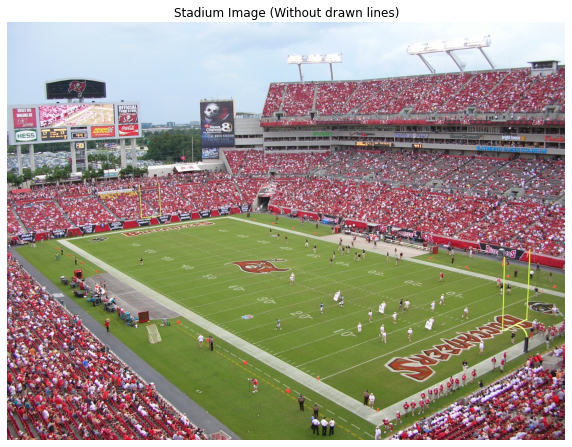

In [5]:
im = np.asarray(Image.open('data/stadium.png'))
plt.figure(figsize=(10, 20))
plt.axis('off')
plt.title("Stadium Image (Without drawn lines)")
plt.imshow(im)

## Problems 4, 5 and 6

Now I shall use the provided pixel locations, and the `draw_line` function to visualize the 3 sets of parallel lines overlayed on the stadium image. Then I shall use the function `intersect_approx` defined in Problem 3, to solve for the vanishing points. Finally, I will find the horizon lines using 2 vanishing points.

In [6]:
# Load in points from points.txt

points = np.genfromtxt("data/points.txt", delimiter=',')

points_dict = []
with open('data/points_dict.txt','r') as inf:
    for line in inf:
        points_dict.append(eval(line))  
        
points_dict = points_dict[0]

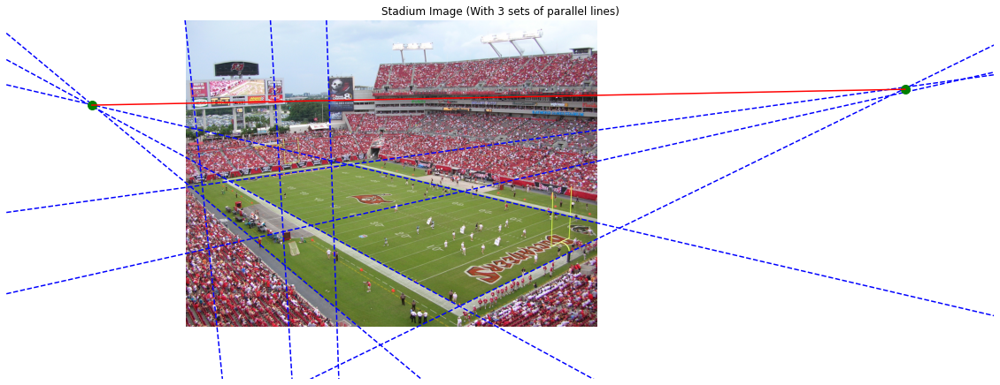

In [7]:
plt.figure(figsize=(20, 40))
plt.axis('off')
plt.title("Stadium Image (With 3 sets of parallel lines)")
plt.xlim([-1000, 4500])
plt.ylim([2000, 0])
plt.imshow(im)

# Probem 4: I use `draw_line` function to visualize the 3 sets of parallel lines overlayed on the stadium image
indx = ['11','12','13','21','22','23','31','32','33']
for id in indx:
    pts = np.array([points_dict['s'+id], points_dict['e'+id]])

    diffs = pts[0,:] - pts[1,:]
    points_dict['g'+id] = diffs/np.linalg.norm(diffs)
    
    draw_line(pts[:,0], pts[:,1], xlims=[-1000, 4500])

# Probem 5: Now, I shall use the function `intersect_approx` defined in Problem 3, to solve for the vanishing points
pt1 = intersect_approx(np.array([points_dict['s11'],points_dict['s12'],points_dict['s13']]),
                       np.array([points_dict['g11'],points_dict['g12'],points_dict['g13']]))
pt2 = intersect_approx(np.array([points_dict['s21'],points_dict['s22'],points_dict['s23']]),
                       np.array([points_dict['g21'],points_dict['g22'],points_dict['g23']]))
plt.plot(pt1[0], pt1[1], 'go', markersize = 10)
plt.plot(pt2[0], pt2[1], 'go', markersize = 10)

# Problem 6: Finally I find the horizon lines using 2 vanishing points
newline(pt1, pt2)

Thus, we have found 2 vanishing points correspoding to 2 sets of parallel lines. We have also found the horizon (given by the red colored line segment connecting the 2 green vanishing points). It does match with our intuitive notion of a horizon since it more or less corresponds to the locus of vanishing points for all straight lines on the groud plane.

# Part 3: Homography

## Problem 7: Looking at the rectangle, and rectification

In [8]:
# Load the 4 corners in pixels and plot the points and use cv2.polylines to draw the polygon

im = np.asarray(Image.open('data/stadium.png'))

corners = []
with open('data/corners.txt','r') as inf:
    for line in inf:
        corners.append(eval(line))  
        
crns = np.array([x for x in corners[0].values()], np.int32)
crns[[2,3],:] = crns[[3,2],:]

isClosed = True
color = (0,255,255)
thickness = 5

im_bordered = im.copy()
im_bordered = cv2.polylines(im_bordered, [crns], isClosed, color, thickness)

Now, we try rectifying the image. 

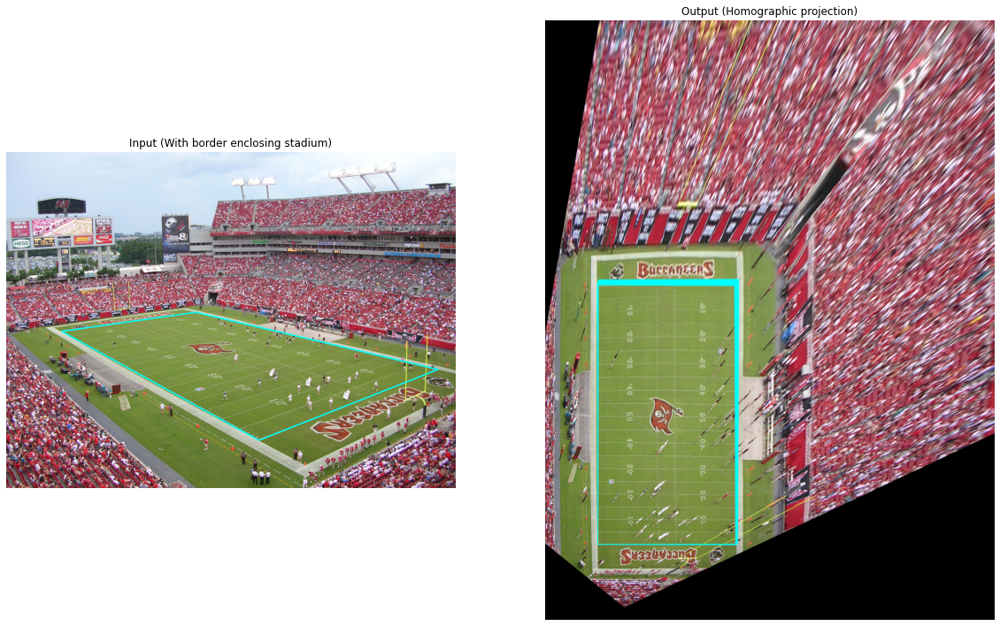

In [9]:
# Find the homography and rectify the rectangle

new_crns = np.array([[200,1000],[200+1000/1.89,1000],[200+1000/1.89,2000],[200,2000]], np.float32)

h_matrix = cv2.getPerspectiveTransform(np.float32(crns), new_crns)
rectified_image = cv2.warpPerspective(im_bordered, h_matrix, (im_bordered.shape[0], im_bordered.shape[1]))

plt.figure(figsize=(20, 40))

plt.axis('off')
plt.subplot(121),plt.imshow(im_bordered),plt.title('Input (With border enclosing stadium)')
plt.axis('off')
plt.subplot(122),plt.imshow(rectified_image),plt.title('Output (Homographic projection)')
plt.axis('off')
plt.show()

## Problem 8: Measuring distances

Here we first draw the points corresponding to the 3 people, plus the segments between them.

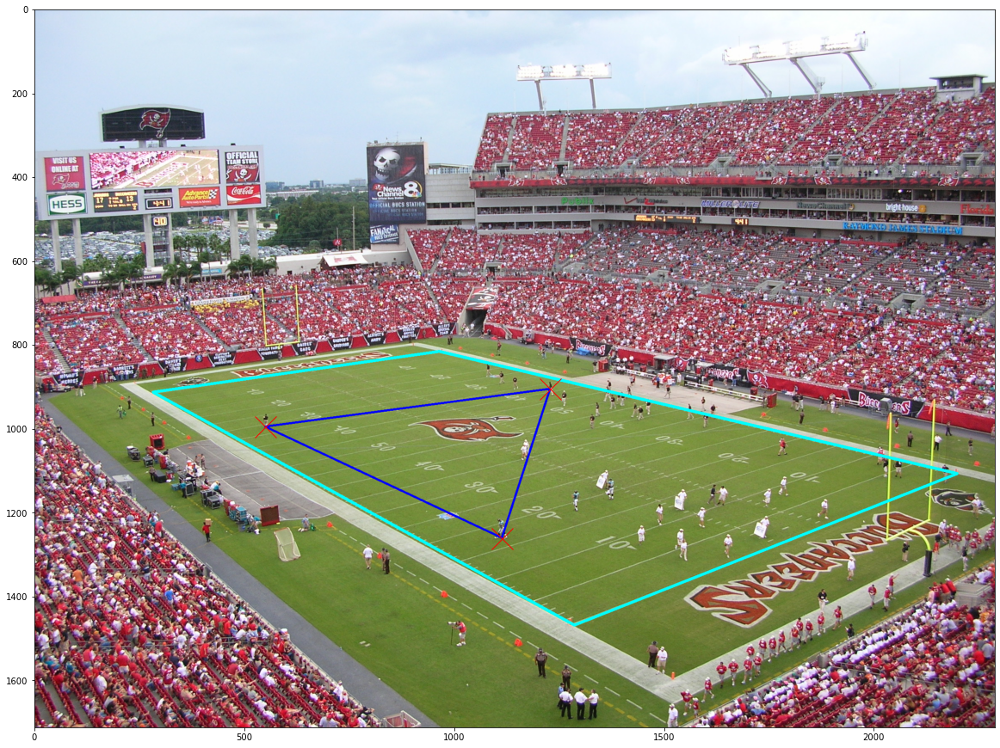

In [10]:
players = []
with open('data/players.txt','r') as inf:
    for line in inf:
        players.append(eval(line))  

players = players[0]

# Plot a few locations on the field, these are points of interest for the next problem
ref1_loc = np.asarray(players['ref1_loc'])
ref2_loc = np.asarray(players['ref2_loc'])
player_loc = np.asarray(players['player_loc'])
ori_locs = np.array([ref1_loc, ref2_loc, player_loc])

plt.figure(figsize=(20, 40))
plrs = np.array([x for x in players.values()], np.int32)
plt.plot(plrs[:,0], plrs[:,1], 'rx', markersize = 25)

im_players = cv2.polylines(im_bordered, [plrs], isClosed, (0,0,255), 3)
plt.imshow(im_players)

We now take a homographic transformation of the playing field, with the point `LL` corresponding to the origin of the projected image. We also see the center of the field marked in the input image with a blue color circle.

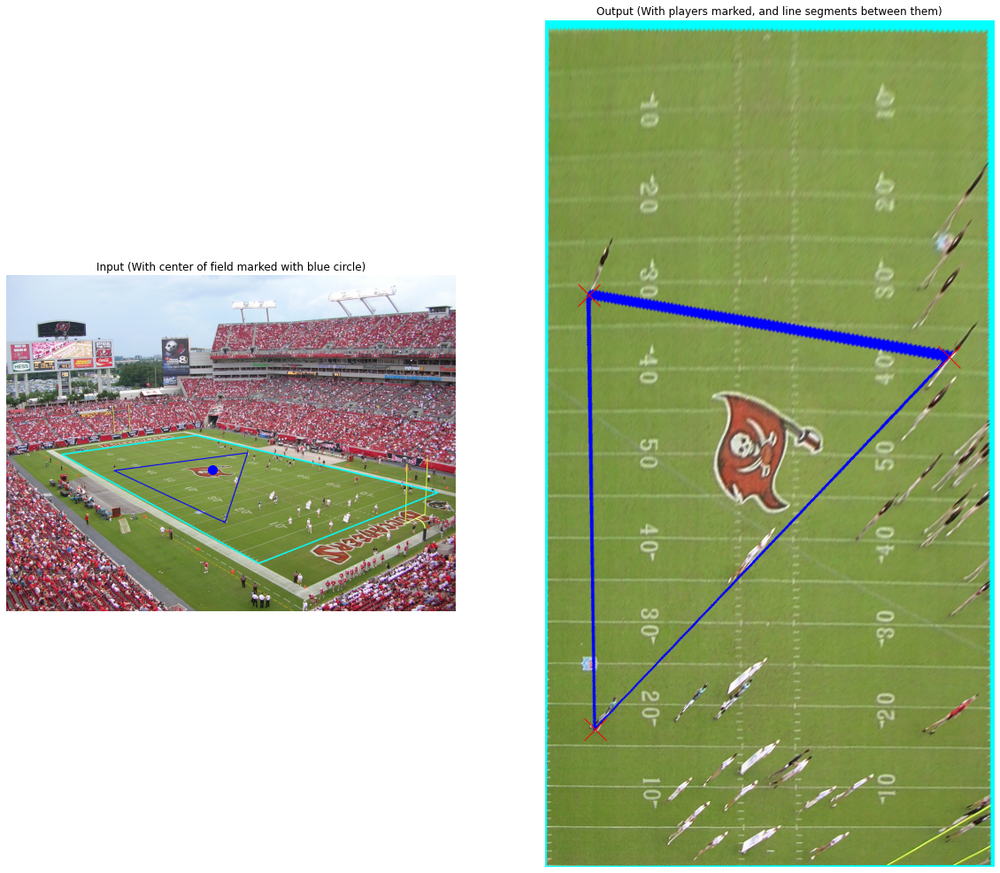

In [11]:
new_crns1 = np.array([[0,0],[530,0],[530,1000],[0,1000]], np.float32)

h_matrix1 = cv2.getPerspectiveTransform(np.float32(crns), new_crns1)
rectified_image1 = cv2.warpPerspective(im_players, h_matrix1, (530, 1000))

new_locs = np.empty([0,2])
for location in ori_locs:
    result = h_matrix1 @ np.hstack([location, 1])
    result = result[0:2]/result[2]
    new_locs = np.vstack((new_locs, result))

h_matrix1_inv = np.linalg.inv(h_matrix1)
center = h_matrix1_inv @ np.array([265, 500, 1])
center = center[0:2]/center[2]

plt.figure(figsize=(20, 40))

plt.axis('off')
plt.subplot(121),plt.imshow(im_players),plt.title('Input (With center of field marked with blue circle)')
plt.plot(center[0], center[1], 'bo', markersize = 10)
plt.axis('off')
plt.subplot(122)
plt.imshow(rectified_image1)
plt.title('Output (With players marked, and line segments between them)')
plt.plot([pts[0] for pts in new_locs], [pts[1] for pts in new_locs], 'rx', markersize = 25)
plt.axis('off')
plt.show()

new_locs = new_locs/10.0

In [12]:
print("The coordinate of ref1 (in yards) is: {}.".format(np.round(new_locs[0,:], 2)))
print("The coordinate of ref2 (in yards) is: {}.".format(np.round(new_locs[1,:], 2)))
print("The coordinate of player (in yards) is: {}.".format(np.round(new_locs[2,:], 2)))
print('\n')

d_21 = np.linalg.norm(new_locs[1,:] - new_locs[0,:])
d_p2 = np.linalg.norm(new_locs[2,:] - new_locs[1,:])
d_1p = np.linalg.norm(new_locs[0,:] - new_locs[2,:])

print("The distance between ref2 and ref1, is: {} yards.".format(np.round(d_21, 2)))
print("The distance between player and ref2, is: {} yards.".format(np.round(d_p2, 2)))
print("The distance between ref1 and player, is: {} yards.".format(np.round(d_1p, 2)))
print('\n')

print("The coordinate of the stadium center (of original image), in pixels, is: {}.".format(np.round(center, 2)))

The coordinate of ref1 (in yards) is: [ 5.06 32.36].
The coordinate of ref2 (in yards) is: [47.61 39.71].
The coordinate of player (in yards) is: [ 5.78 83.69].


The distance between ref2 and ref1, is: 43.19 yards.
The distance between player and ref2, is: 60.7 yards.
The distance between ref1 and player, is: 51.33 yards.


The coordinate of the stadium center (of original image), in pixels, is: [1050.33  990.79].


Please note that the coordinates of ref1, ref2, and the player, has been given with respect to the point homographic projection of the point `LL` as the origin (and the usual convention of x and y axes for images).

## Problem 9: Highlighting yards using lines

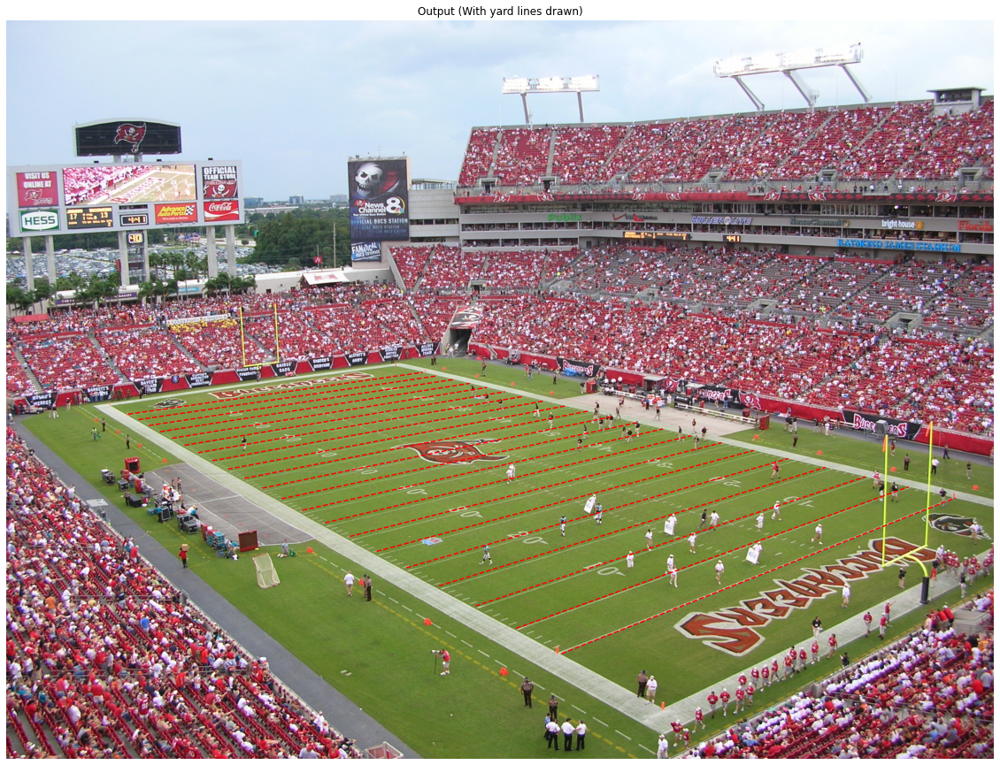

In [13]:
plt.figure(figsize=(20, 40))
plt.imshow(im)
plt.title('Output (With yard lines drawn)')
for line_no in np.linspace(0, 100, num = 21):
    start = h_matrix1_inv @ np.array([0, 10*line_no, 1])
    start = start[0:2]/start[2]
    end = h_matrix1_inv @ np.array([530, 10*line_no, 1])
    end = end[0:2]/end[2]
    newline(start, end, linestyle = '--')
plt.axis('off')
plt.show()

# Part 4: Single-View Metrology - A Rocket Factory

## Problem 10 .... Not done yet...

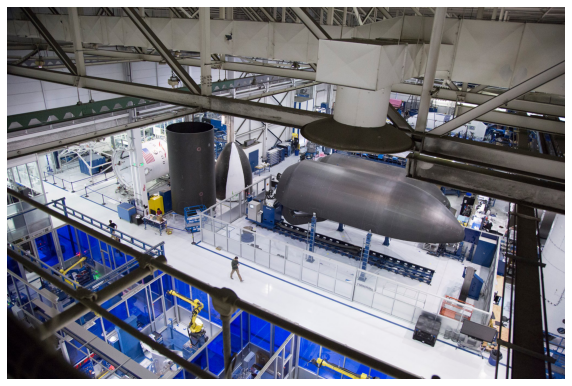

In [14]:
# interstage measurement from https://spaceflight101.com/spacerockets/falcon-9-ft/
from imageio import imread
plt.figure(figsize=(10, 20))
plt.axis('off')

image = imread('data/composites.jpg')
plt.imshow(image)

with open('data/spacex_factory.txt','r') as inf:
    points_dict = eval(inf.read())

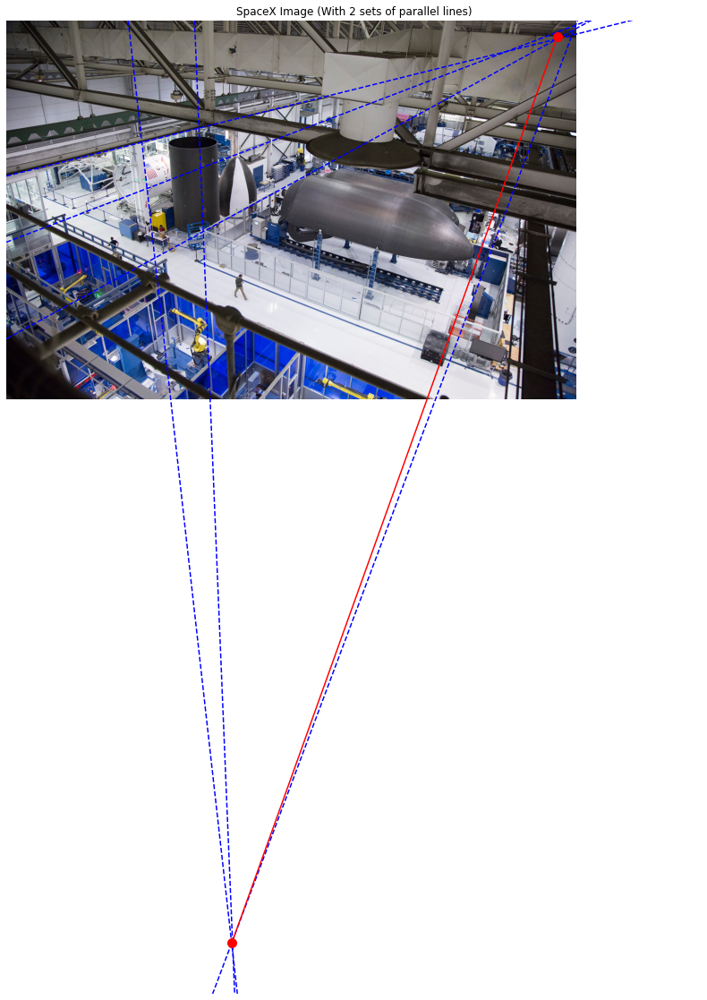

In [15]:
plt.figure(figsize=(30, 20))
plt.axis('off')
plt.title("SpaceX Image (With 2 sets of parallel lines)")
plt.xlim([0, 2500])
plt.ylim([3500, 0])
plt.imshow(image)

indx = ['11','12','13','21','22','23']

for id in indx:
    pts = np.array([points_dict['s'+id], points_dict['e'+id]])

    diffs = pts[0,:] - pts[1,:]
    points_dict['g'+id] = diffs/np.linalg.norm(diffs)
    
    draw_line(pts[:,0], pts[:,1], xlims=[-1000, 4500])

pt1 = intersect_approx(np.array([points_dict['s11'],points_dict['s12'],points_dict['s13']]),
                       np.array([points_dict['g11'],points_dict['g12'],points_dict['g13']]))
pt2 = intersect_approx(np.array([points_dict['s21'],points_dict['s22'],points_dict['s23']]),
                       np.array([points_dict['g21'],points_dict['g22'],points_dict['g23']]))
plt.plot(pt1[0], pt1[1], 'ro', markersize = 10)
plt.plot(pt2[0], pt2[1], 'ro', markersize = 10)

# The horizon line using 2 vanishing points
newline(pt1, pt2)

In [16]:
# New stuff for this problem
metrology_points = []
with open('data/rocket_metrology.txt','r') as inf:
    for line in inf:
        metrology_points.append(eval(line))  
        
metrology_points = metrology_points[0]

reference_point = metrology_points['reference_point']
top_interstage = metrology_points['top_interstage']
top_nosecone = metrology_points['top_nosecone']
bottom_nosecone = metrology_points['bottom_nosecone']
bottom_interstage = metrology_points['bottom_interstage']

print(metrology_points)

{'reference_point': (761, 527), 'top_interstage': (760, 442), 'top_nosecone': (830, 500), 'bottom_nosecone': (834, 676), 'bottom_interstage': (700, 750)}


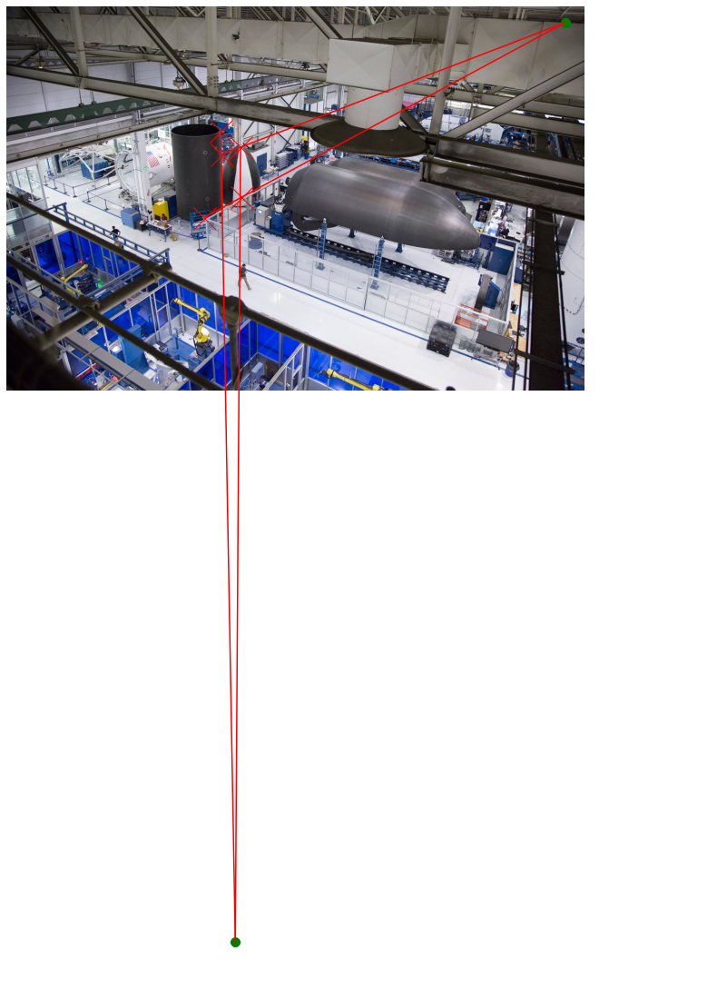

In [17]:
met_points = np.array([x for x in metrology_points.values()])

plt.figure(figsize=(30, 20))
plt.axis('off')
plt.xlim([0, 2500])
plt.ylim([3500, 0])
plt.plot(met_points[:,0], met_points[:,1], 'rx', markersize = 25)
plt.plot(pt1[0], pt1[1], 'go', markersize = 10)
plt.plot(pt2[0], pt2[1], 'go', markersize = 10)
newline(top_interstage, pt2)
newline(reference_point, pt1)
newline(top_nosecone, pt2)
newline(bottom_interstage, pt1)

plt.imshow(image)

In [18]:
def cross_ratio(t, b, r, v_z):
    norm = lambda u, v: np.linalg.norm(np.array(u) - np.array(v))
    return norm(r,b) * norm(t,v_z) / norm(t,b) / norm(r,v_z)

c = cross_ratio(reference_point, bottom_interstage, top_interstage, pt2)
print(f"The estimated height of the nosecone is: {round(4.4/c, 2)} meters.")

The estimated height of the nosecone is: 3.3 meters.
